<a id="1"></a>
<h1 style='background:deeppink; border:0; color:white'><center>1.Data loading and overview</center></h1>

In [1]:
import os
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
# from matplotlib_venn import venn2
from matplotlib import pyplot
import seaborn as sns
from tqdm import tqdm
from scipy.signal import find_peaks

from sklearn.metrics import mean_absolute_error

In [2]:
DATA_DIR = Path("/home/knikaido/work/Ventilator-Pressure-Prediction/data/ventilator-pressure-prediction")
OUTPUT_DIR = Path('./output/')

In [3]:
train = pd.read_csv(DATA_DIR / 'train.csv',index_col=0)
test  = pd.read_csv(DATA_DIR / 'test.csv', index_col=0)

/usr/local/lib/python3.8/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [4]:
PRESSURE_MIN = np.min(train['pressure'])
PRESSURE_MAX = np.max(train['pressure'])
PRESSURE_STEP = 0.07030215

In [7]:
oof = pd.read_csv('../61/output/oof_total_61.csv',index_col=0)

In [8]:
display(train)

display(test)

,breath_id,R,C,time_step,u_in,u_out,pressure
id,,,,,,,
1,1,20,50,0.000000,0.083334,0,5.837492
2,1,20,50,0.033652,18.383041,0,5.907794
3,1,20,50,0.067514,22.509278,0,7.876254
4,1,20,50,0.101542,22.808822,0,11.742872
5,1,20,50,0.135756,25.355850,0,12.234987
...,...,...,...,...,...,...,...
6035996,125749,50,10,2.504603,1.489714,1,3.869032
6035997,125749,50,10,2.537961,1.488497,1,3.869032
6035998,125749,50,10,2.571408,1.558978,1,3.798729


,breath_id,R,C,time_step,u_in,u_out
id,,,,,,
1,0,5,20,0.000000,0.000000,0
2,0,5,20,0.031904,7.515046,0
3,0,5,20,0.063827,14.651675,0
4,0,5,20,0.095751,21.230610,0
5,0,5,20,0.127644,26.320956,0
...,...,...,...,...,...,...
4023996,125748,20,10,2.530117,4.971245,1
4023997,125748,20,10,2.563853,4.975709,1
4023998,125748,20,10,2.597475,4.979468,1


In [9]:
train['train_test'] = 'train'
test['train_test'] = 'test'
full = pd.concat([train, test], axis=0)

<a id="6"></a>
<h2>R and C</h2>

In [10]:
train['R_C'] = [f'{r}_{c}' for r, c in zip(train['R'], train['C'])]
test['R_C'] = [f'{r}_{c}' for r, c in zip(test['R'], test['C'])]
full['R_C'] = [f'{r}_{c}' for r, c in zip(full['R'], full['C'])]

<AxesSubplot:xlabel='R_C', ylabel='count'>

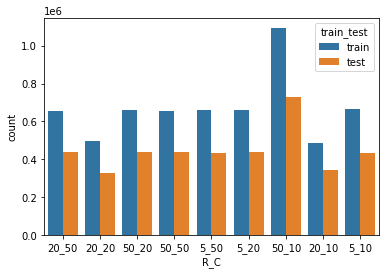

In [11]:
sns.countplot(data=full, x='R_C', hue='train_test')

<a id="7"></a>
<h2>time_step</h2>

> time_step - the actual time stamp.

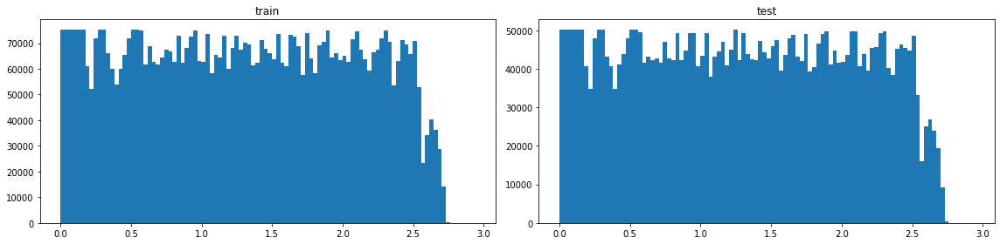

In [12]:
plt.figure(figsize=(16, 4))
plt.subplot(121)
plt.hist(train['time_step'], bins=100) 
plt.title('train')

plt.subplot(122)
plt.hist(test['time_step'], bins=100);
plt.title('test')

plt.tight_layout()

<a id="8"></a>
<h2>u_in</h2>

> the control input for the inspiratory solenoid valve. Ranges from 0 to 100.

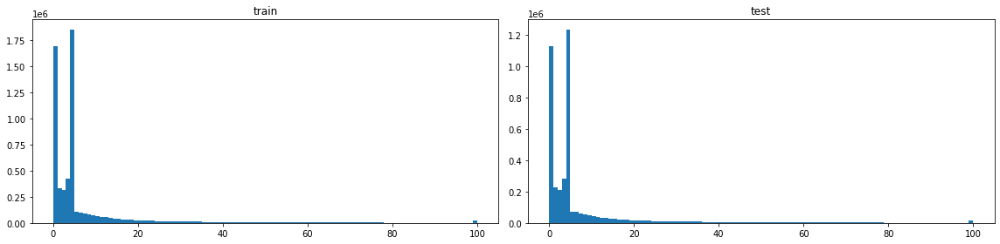

In [13]:
plt.figure(figsize=(16, 4))
plt.subplot(121)
plt.hist(train['u_in'], bins=100) 
plt.title('train')

plt.subplot(122)
plt.hist(test['u_in'], bins=100);
plt.title('test')

plt.tight_layout()

<a id="9"></a>
<h2>u_out</h2>

> u_out - the control input for the exploratory solenoid valve. Either 0 or 1.

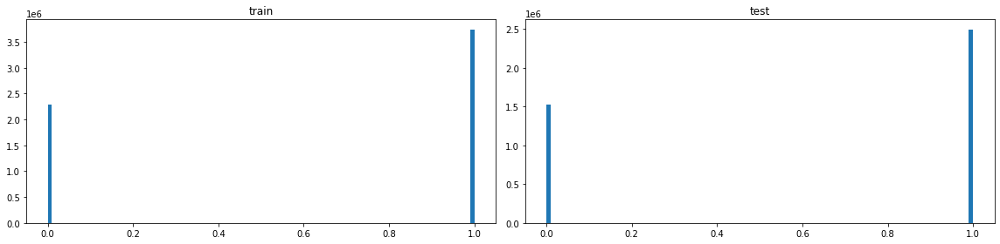

In [14]:
plt.figure(figsize=(16, 4))
plt.subplot(121)
plt.hist(train['u_out'], bins=100) 
plt.title('train')

plt.subplot(122)
plt.hist(test['u_out'], bins=100);
plt.title('test')

plt.tight_layout()

<a id="10"></a>
<h2>pressure</h2>

> pressure - the airway pressure measured in the respiratory circuit, measured in cmH2O.


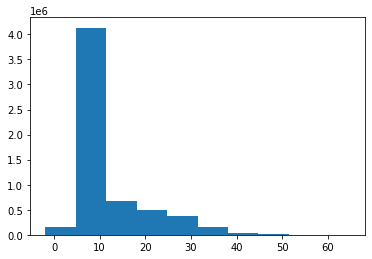

In [15]:
plt.hist(train['pressure']);

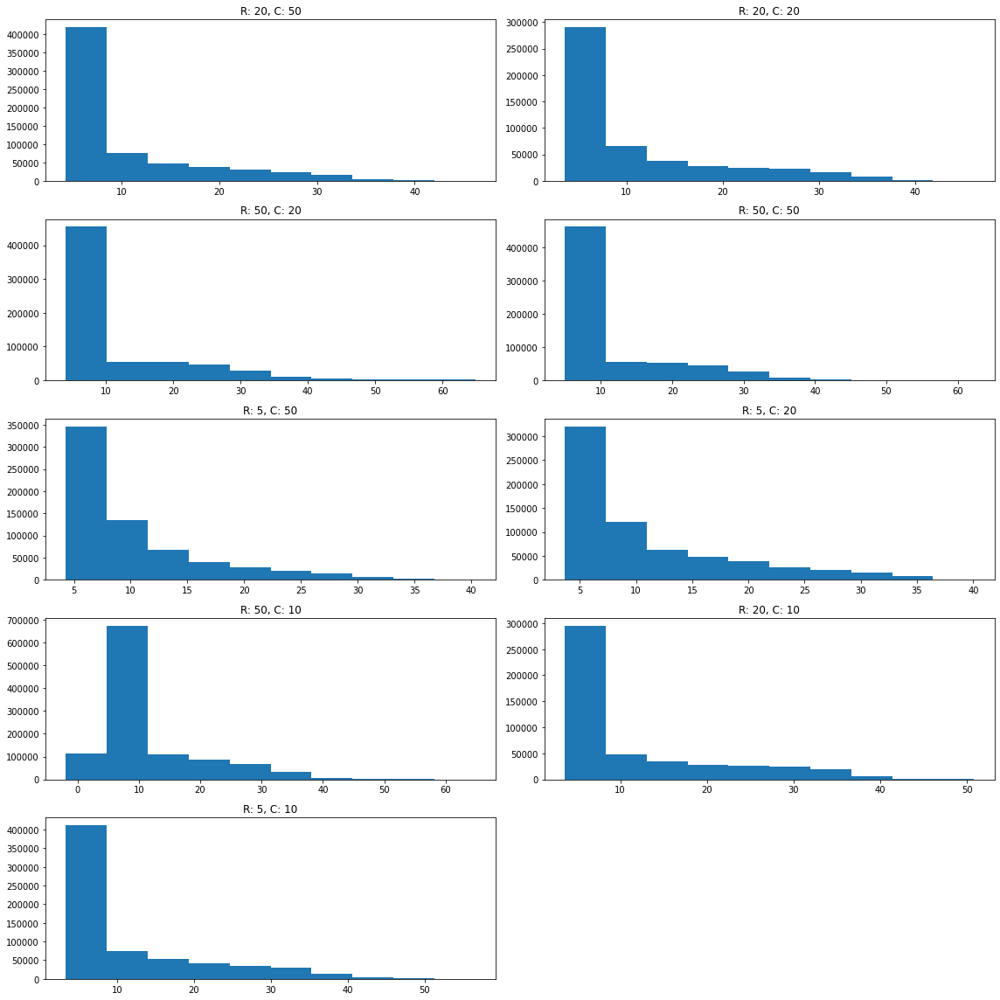

In [16]:
plt.figure(figsize=(16, 16))
i = 1
for r_c in train['R_C'].unique():
    tmp = train.query('R_C == @r_c')
    plt.subplot(5, 2, i)
    plt.hist(tmp['pressure'])
    r, c = r_c.split('_')
    plt.title(f'R: {r}, C: {c}')
    i += 1
    
plt.tight_layout()
plt.show()

<a id="200"></a>

<h1 style='background:deeppink; border:0; color:white'><center>3.Visualize for each breahth id and R_C</center></h1>

In [17]:
!pip install ipyplot

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [18]:
def compute_metric(preds, trues, u_outs):
    """
    Metric for the problem, as I understood it.
    """
    
    y = trues
    w = 1 - u_outs
    
    assert y.shape == preds.shape and w.shape == y.shape, (y.shape, preds.shape, w.shape)
    
    mae = w * np.abs(y - preds)
    mae = mae.sum() / w.sum()
    
    return mae

def get_score(y_pred, y_true, u_outs):
    return compute_metric(y_pred, y_true, u_outs)

In [19]:
b_id_gby = train.groupby(['breath_id'])
train['u_in_cumsum'] = b_id_gby['u_in'].cumsum()

In [20]:
tmp_dir = Path('../../../data/image/')
tmp_dir.mkdir(exist_ok=True)

In [21]:
train['oof'] = oof['pred']

In [22]:
train

,breath_id,R,C,time_step,u_in,u_out,pressure,train_test,R_C,u_in_cumsum,oof
id,,,,,,,,,,,
1,1,20,50,0.000000,0.083334,0,5.837492,train,20_50,0.083334,5.794870
2,1,20,50,0.033652,18.383041,0,5.907794,train,20_50,18.466375,5.863098
3,1,20,50,0.067514,22.509278,0,7.876254,train,20_50,40.975653,7.852197
4,1,20,50,0.101542,22.808822,0,11.742872,train,20_50,63.784476,11.792898
5,1,20,50,0.135756,25.355850,0,12.234987,train,20_50,89.140326,12.389834
...,...,...,...,...,...,...,...,...,...,...,...
6035996,125749,50,10,2.504603,1.489714,1,3.869032,train,50_10,387.109297,20.879313
6035997,125749,50,10,2.537961,1.488497,1,3.869032,train,50_10,388.597794,23.885118
6035998,125749,50,10,2.571408,1.558978,1,3.798729,train,50_10,390.156772,24.777328


In [ ]:
import scipy.signal
from scipy import signal

In [45]:
def lowpass(x, samplerate, fp, fs, gpass, gstop):
    fn = samplerate / 2   #ナイキスト周波数
    wp = fp / fn  #ナイキスト周波数で通過域端周波数を正規化
    ws = fs / fn  #ナイキスト周波数で阻止域端周波数を正規化
    N, Wn = signal.buttord(wp, ws, gpass, gstop)  #オーダーとバターワースの正規化周波数を計算
    b, a = signal.butter(N, Wn, "low")            #フィルタ伝達関数の分子と分母を計算
    y = signal.filtfilt(b, a, x)                  #信号に対してフィルタをかける
    return y  

def highpass(x, samplerate, fp, fs, gpass, gstop):
    fn = samplerate / 2   #ナイキスト周波数
    wp = fp / fn  #ナイキスト周波数で通過域端周波数を正規化
    ws = fs / fn  #ナイキスト周波数で阻止域端周波数を正規化
    N, Wn = signal.buttord(wp, ws, gpass, gstop)  #オーダーとバターワースの正規化周波数を計算
    b, a = signal.butter(N, Wn, "high")            #フィルタ伝達関数の分子と分母を計算
    y = signal.filtfilt(b, a, x)                  #信号に対してフィルタをかける
    return y  

In [46]:
fp_low = 5 # 通過域端周波数[Hz]
fs_low = 10 # 阻止域端周波数[Hz]
gpass_low = 3 # 通過域端最大損失[dB]
gstop_low = 40 # 阻止域端最小損失[dB]
samplerate = 100
def lowpass_filter(series):
    return lowpass(series, samplerate, fp_low, fs_low, gpass_low, gstop_low)

In [55]:
fp_high = 40 # 通過域端周波数[Hz]
fs_high = 35 # 阻止域端周波数[Hz]
gpass_high = 3 # 通過域端最大損失[dB]
gstop_high = 40 # 阻止域端最小損失[dB]
samplerate = 100
def highpass_filter(series):
    return highpass(series, samplerate, fp_high, fs_high, gpass_high, gstop_high)

In [56]:
image_paths = []
labels = []

for r_c in train['R_C'].unique():
    df = train.query('R_C == @r_c')
    for breath_id in df['breath_id'].unique()[:12]:
        tmp_df = train.query('breath_id == @breath_id')
        R = tmp_df.iloc[0, 1]
        C = tmp_df.iloc[0, 2]
        plt.plot(tmp_df['time_step'], tmp_df['pressure'], label='pressure')
        plt.plot(tmp_df['time_step'], tmp_df['oof'], label='oof_pressure')
        plt.plot(tmp_df['time_step'], lowpass_filter(tmp_df['u_in']), label='lowpass')
        plt.plot(tmp_df['time_step'], highpass_filter(tmp_df['u_in']), label='highpass')
        plt.plot(tmp_df['time_step'], tmp_df['u_in_cumsum'] * (np.max(tmp_df['pressure'])) / (np.max(tmp_df['u_in_cumsum'])), label='u_in_cumsum')
        plt.plot(tmp_df['time_step'], tmp_df['u_in'], label='u_in')
        plt.plot(tmp_df['time_step'], tmp_df['u_out'], label='u_out')
        plt.title(f'R: {R}, C: {C}, breath_id: {breath_id}')
        plt.legend()
        plt.savefig(tmp_dir / f'{breath_id}.jpg')
        image_paths.append(str(tmp_dir / f'{breath_id}.jpg'))
        labels.append(f'R: {R}, C: {C}')
        plt.close()


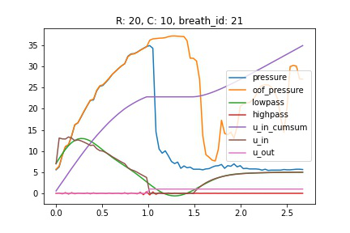
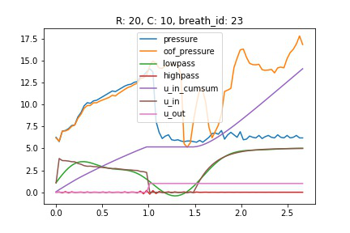
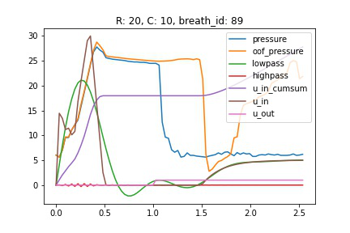
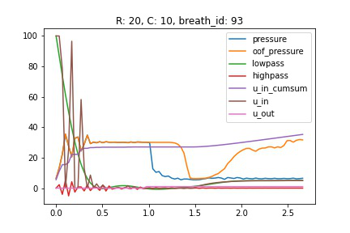
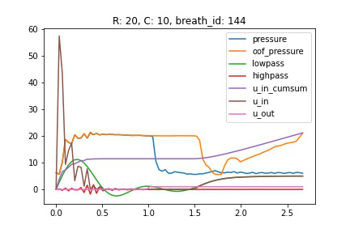
...
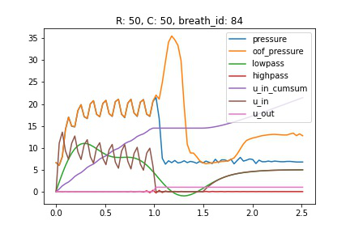
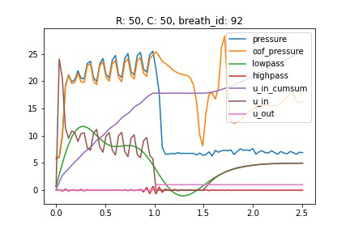
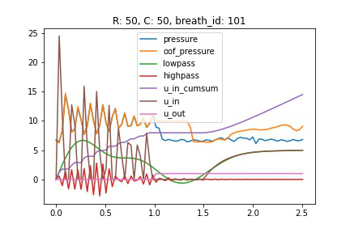
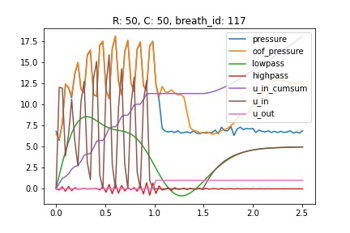
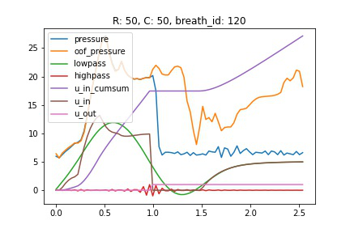

In [57]:
import ipyplot
ipyplot.plot_class_tabs(image_paths, labels, force_b64=True, img_width=350)

In [31]:
score = get_score(train['oof'].values, train['pressure'].values, train['u_out'].values)
score

0.1746906496909819

In [32]:
train['score'] = abs(train['pressure'] - train['oof'])

In [33]:
R_Cs = train['R_C'].unique()
for R_C in R_Cs:
    tmp = train[(train['R_C']==R_C) & (train['u_out']==0)]
    score = np.mean(tmp['score'])
    print(f'R_C = {R_C}, score = {score} ')
#     break

R_C = 50_50, score = 0.2745023600443968 
R_C = 50_10, score = 0.1786114623771573 
R_C = 20_10, score = 0.15289081352729372 
R_C = 50_20, score = 0.26802726290458184 
R_C = 5_50, score = 0.10855539681344038 
R_C = 20_20, score = 0.16184471751802354 
R_C = 5_20, score = 0.10757030773567934 
R_C = 5_10, score = 0.1448639090655869 
R_C = 20_50, score = 0.16598303494824898 


In [34]:
np.mean(train[(train['R']!=50) & (train['u_out']==0)]['score'])

0.13806448182030717

In [35]:
breath_ids = train['breath_id'].unique()
scores = []
for id_ in tqdm(breath_ids):
    tmp = train[(train['breath_id'] == id_) & (train['u_out']==0)]
    score = mean_absolute_error(tmp['pressure'], tmp['oof'])
    scores.append(score)

100%|██████████| 15090/15090 [00:34<00:00, 435.10it/s]


In [36]:
scores = np.array(scores)

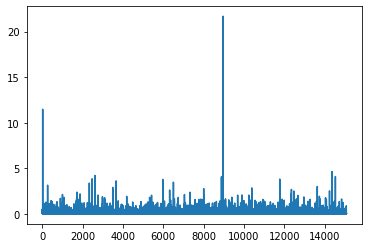

In [37]:
plt.plot(scores)

In [38]:
scores_sorted_idx = scores.argsort()[::-1]

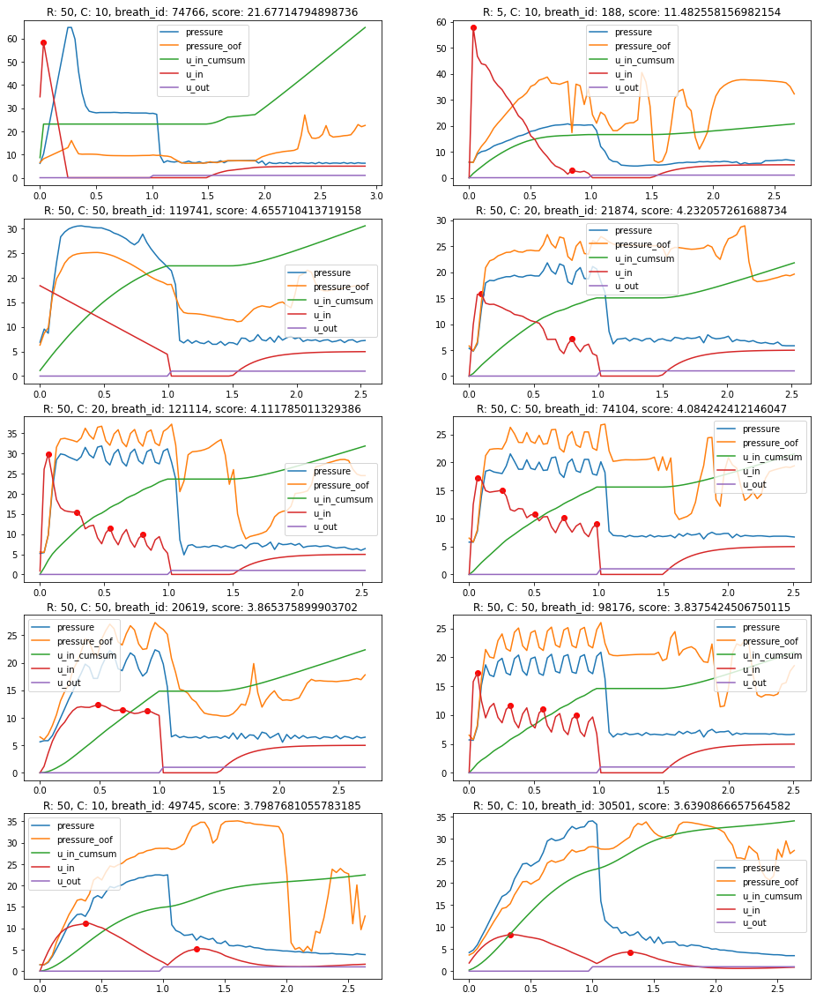

In [40]:
fig, ax = plt.subplots(5, 2, figsize=(16, 20))
worth_scores = []
for i in range(10):
    score = scores[scores_sorted_idx[i]]
    breath_id = breath_ids[scores_sorted_idx[i]]
    tmp_df = train[train['breath_id'] == breath_id].reset_index(drop=True)
    worth_scores.append((tmp_df['pressure'] - tmp_df['oof']).values)
    peaks = find_peaks(tmp_df['u_in'], distance=5)[0]

    R = tmp_df.iloc[0, 2]
    C = tmp_df.iloc[0, 3]
    ax[int(i/2)][int(i%2)].plot(tmp_df['time_step'], tmp_df['pressure'], label='pressure')
    ax[int(i/2)][int(i%2)].plot(tmp_df['time_step'], tmp_df['oof'], label='pressure_oof')
    ax[int(i/2)][int(i%2)].plot(tmp_df['time_step'], tmp_df['u_in_cumsum'] * (np.max(tmp_df['pressure'])) / (np.max(tmp_df['u_in_cumsum'])), label='u_in_cumsum')
    ax[int(i/2)][int(i%2)].plot(tmp_df['time_step'], tmp_df['u_in'], label='u_in')
    ax[int(i/2)][int(i%2)].plot(tmp_df['time_step'], tmp_df['u_out'], label='u_out')
    ax[int(i/2)][int(i%2)].scatter(tmp_df['time_step'][peaks], tmp_df['u_in'][peaks], c='red')
    ax[int(i/2)][int(i%2)].set_title(f'R: {R}, C: {C}, breath_id: {breath_id}, score: {score}')
    ax[int(i/2)][int(i%2)].legend()
plt.savefig('bad_score.png')

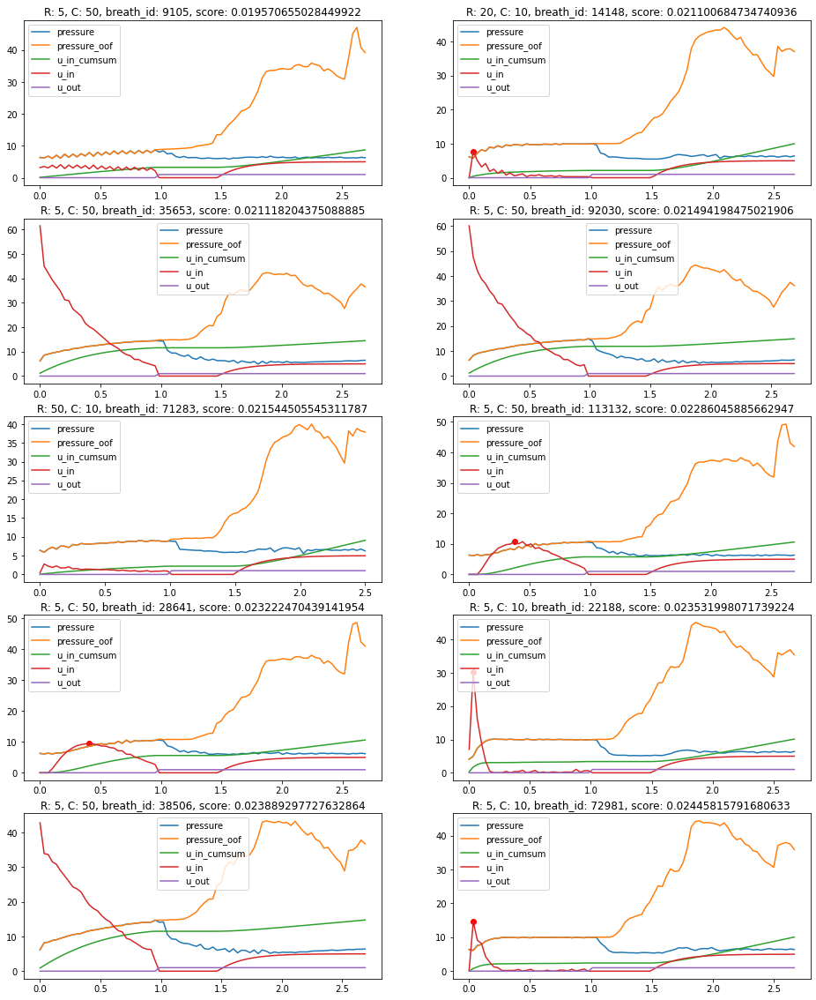

In [72]:
fig, ax = plt.subplots(5, 2, figsize=(16, 20))
for i in range(10):
    score = scores[scores_sorted_idx[len(scores_sorted_idx)-1-i]]
    breath_id = breath_ids[scores_sorted_idx[len(scores_sorted_idx)-1-i]]
    tmp_df = train[train['breath_id'] == breath_id].reset_index(drop=True)
    peaks = find_peaks(tmp_df['u_in'], distance=3, prominence=(5, None))[0]


    R = tmp_df.iloc[0, 2]
    C = tmp_df.iloc[0, 3]
    ax[int(i/2)][int(i%2)].plot(tmp_df['time_step'], tmp_df['pressure'], label='pressure')
    ax[int(i/2)][int(i%2)].plot(tmp_df['time_step'], tmp_df['pressure_oof'], label='pressure_oof')
    ax[int(i/2)][int(i%2)].plot(tmp_df['time_step'], tmp_df['u_in_cumsum'] * (np.max(tmp_df['pressure'])) / (np.max(tmp_df['u_in_cumsum'])), label='u_in_cumsum')
    ax[int(i/2)][int(i%2)].plot(tmp_df['time_step'], tmp_df['u_in'], label='u_in')
    ax[int(i/2)][int(i%2)].scatter(tmp_df['time_step'][peaks], tmp_df['u_in'][peaks], c='red')
    ax[int(i/2)][int(i%2)].plot(tmp_df['time_step'], tmp_df['u_out'], label='u_out')
    ax[int(i/2)][int(i%2)].set_title(f'R: {R}, C: {C}, breath_id: {breath_id}, score: {score}')
    ax[int(i/2)][int(i%2)].legend()

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='pressure', ylabel='Density'>

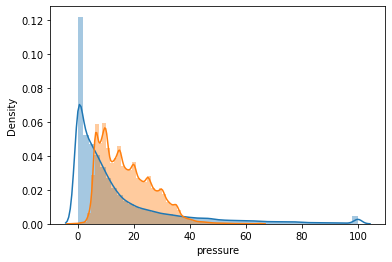

In [41]:
sns.distplot(train[train['u_out']==0]['u_in'])
sns.distplot(train[train['u_out']==0]['pressure'])

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='pressure', ylabel='Density'>

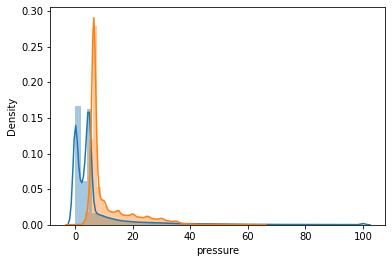

In [42]:
sns.distplot(train['u_in'])
sns.distplot(train['pressure'])

In [43]:
unique_pressures = pd.read_csv(DATA_DIR / 'train.csv',index_col=0)["pressure"].unique()
sorted_pressures = np.sort(unique_pressures)

/usr/local/lib/python3.8/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [44]:
total_pressures_len = len(sorted_pressures)

In [45]:
def find_nearest(prediction):
    insert_idx = np.searchsorted(sorted_pressures, prediction['pressure_oof'])
    if insert_idx == total_pressures_len:
        # If the predicted value is bigger than the highest pressure in the train dataset,
        # return the max value.
        return sorted_pressures[-1]
    elif insert_idx == 0:
        # Same control but for the lower bound.
        return sorted_pressures[0]
    lower_val = sorted_pressures[insert_idx - 1]
    upper_val = sorted_pressures[insert_idx]
    if min(abs(lower_val - prediction['pressure_oof']), abs(upper_val - prediction['pressure_oof'])) > 0.01:
        return lower_val if abs(lower_val - prediction['pressure_oof']) < abs(upper_val - prediction['pressure_oof']) else upper_val
    else:
        return prediction['pressure_oof']
#     return abs(lower_val - prediction['pressure_oof']) if abs(lower_val - prediction['pressure_oof']) < abs(upper_val - prediction['pressure_oof']) else abs(upper_val - prediction['pressure_oof'])
#     return lower_val if prediction['oof_diff'] < 0 else upper_val
#     return lower_val if abs(lower_val - prediction['pressure_oof']) < abs(upper_val - prediction['pressure_oof']) else upper_val

In [46]:
def find_nearest(prediction):
    insert_idx = np.searchsorted(sorted_pressures, prediction['pressure_oof'])
    if insert_idx == total_pressures_len:
        # If the predicted value is bigger than the highest pressure in the train dataset,
        # return the max value.
        return sorted_pressures[-1]
    elif insert_idx == 0:
        # Same control but for the lower bound.
        return sorted_pressures[0]
    lower_val = sorted_pressures[insert_idx - 1]
    upper_val = sorted_pressures[insert_idx]
    if min(abs(lower_val - prediction['pressure_oof']), abs(upper_val - prediction['pressure_oof'])) > 0.01:
        return lower_val if abs(lower_val - prediction['pressure_oof']) < abs(upper_val - prediction['pressure_oof']) else upper_val
    else:
        return prediction['pressure_oof']
#     return abs(lower_val - prediction['pressure_oof']) if abs(lower_val - prediction['pressure_oof']) < abs(upper_val - prediction['pressure_oof']) else abs(upper_val - prediction['pressure_oof'])
#     return lower_val if prediction['oof_diff'] < 0 else upper_val
#     return lower_val if abs(lower_val - prediction['pressure_oof']) < abs(upper_val - prediction['pressure_oof']) else upper_val

In [73]:
train_4 = train[train['breath_id']==21874]
train_4['oof_diff'] = train_4['pressure_oof'].diff()

<ipython-input-73-56477d80383c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_4['oof_diff'] = train_4['pressure_oof'].diff()


In [74]:
train_4['pp_pressure_oof'] = train_4[["pressure_oof", 'oof_diff']].apply(find_nearest, axis=1)

<ipython-input-74-3c4fe81642eb>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_4['pp_pressure_oof'] = train_4[["pressure_oof", 'oof_diff']].apply(find_nearest, axis=1)


In [50]:
np.mean(abs(train_4['pressure'] - train_4['pressure_oof'])[train_4['u_out']==0])

15.900490442941898

In [51]:
np.mean(abs(train_4['pressure'] - train_4['pp_pressure_oof'])[train_4['u_out']==0])

15.898055409026444

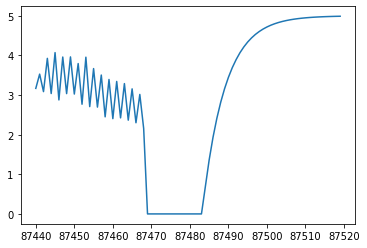

In [76]:
# plt.plot(train_4['pressure'])
# plt.plot(train_4['pressure_oof'])
plt.plot(train_4['u_in'])
# plt.plot(train_4['oof_diff'])


In [221]:
np.mean(abs(train['pressure'] - train[["pressure_oof"]].apply(find_nearest, axis=1))[train['u_out']==0])

0.19484780547025474

In [232]:
np.mean(abs(train['pressure'] - np.clip(np.round( (train[["pressure_oof"]].apply(find_nearest, axis=1) - PRESSURE_MIN)/PRESSURE_STEP ) * PRESSURE_STEP + PRESSURE_MIN, PRESSURE_MIN, PRESSURE_MAX))[train['u_out']==0])

0.1945848407323039

In [231]:
np.mean(abs(train['pressure'] - np.clip(np.round( (train['pressure_oof'] - PRESSURE_MIN)/PRESSURE_STEP ) * PRESSURE_STEP + PRESSURE_MIN, PRESSURE_MIN, PRESSURE_MAX))[train['u_out']==0])

0.19458514763600987

In [85]:
train_4 = train[train['breath_id']==21874]
train_4[(train_4['time_step'] >= 0.8) & (train_4['time_step'] <= 1.5)]

,id,breath_id,R,C,time_step,u_in,u_out,pressure,train_test,R_C,u_in_cumsum,pressure_oof,score
210026,1050587,21874,50,20,0.830154,5.754495,0,20.108827,train,50_20,271.115323,25.110119,5.001292
210027,1050588,21874,50,20,0.862074,4.673742,0,20.882151,train,50_20,275.789064,26.024593,5.142442
210028,1050589,21874,50,20,0.894054,5.805243,0,18.773086,train,50_20,281.594307,23.614975,4.841889
210029,1050590,21874,50,20,0.925963,6.137099,0,18.702784,train,50_20,287.731407,23.608790,4.906006
210030,1050591,21874,50,20,0.957911,4.318381,0,21.093057,train,50_20,292.049788,26.080814,4.987757
210031,1050592,21874,50,20,0.989864,3.940789,0,20.600942,train,50_20,295.990578,25.785084,5.184142
210032,1050593,21874,50,20,1.021715,0.000000,1,18.210669,train,50_20,295.990578,25.175598,6.964929
210033,1050594,21874,50,20,1.053592,0.000000,1,16.101605,train,50_20,295.990578,23.767159,7.665554
210034,1050595,21874,50,20,1.085505,0.000000,1,8.579275,train,50_20,295.990578,20.651089,12.071814
210035,1050596,21874,50,20,1.117436,0.000000,1,6.189002,train,50_20,295.990578,19.903578,13.714576


In [88]:
from scipy import interpolate

In [89]:
surikire = train[(train['R']==50)].groupby('breath_id').agg('max')
surikire = surikire[surikire['pressure'] >= 64.8].reset_index()

In [128]:
surikire

,breath_id,R,C,time_step,u_in,u_out,pressure
0,1548,50,20,2.540747,69.166258,1,64.820992
1,1624,50,20,2.541911,77.684058,1,64.820992
2,2493,50,20,2.539216,75.594509,1,64.820992
3,6408,50,20,2.538791,76.362221,1,64.820992
4,6717,50,20,2.538099,73.138837,1,64.820992
...,...,...,...,...,...,...,...
98,120773,50,20,2.538993,75.271504,1,64.820992
99,121488,50,20,2.540168,77.036087,1,64.820992
100,124223,50,20,2.538108,69.185272,1,64.820992
101,124235,50,20,2.538780,71.187274,1,64.820992


In [90]:
surikire_breath_ids = surikire['breath_id'].values
len(surikire_breath_ids)

103

In [91]:
def spline1(x,y,point):
    f = interpolate.interp1d(x, y,kind="cubic") 
    X = np.linspace(x[0],x[-1],num=point,endpoint=True)
    Y = f(X)
    return X,Y

In [94]:
df_hoseis = []
for surikire_breath_id in tqdm(surikire_breath_ids):
    df_ori = train[train['breath_id']==surikire_breath_id].reset_index(drop=True)
    df_ = df_ori[df_ori['pressure'] < 64.8].reset_index(drop=True)

    x = df_['time_step'].values
    u = df_['u_in'].values
    p = df_['pressure'].values
    # u_out_time = (df_['u_out'].values == 0).sum()
    # u_out_time = df_['time_step'].values[u_out_time]
    # x_,u = spline1(x,u,80)
    x_,p = spline1(x,p,80)
    df_ori['pressure'] = p
    df_hoseis.append(df_ori)

100%|██████████| 103/103 [00:00<00:00, 198.81it/s]


In [95]:
df_hoseis = pd.concat(df_hoseis).reset_index(drop=True)

In [102]:
df_hoseis

,breath_id,R,C,time_step,u_in,u_out,pressure
0,1548,50,20,0.000000,69.166258,0,6.329607
1,1548,50,20,0.031918,66.649829,0,11.557880
2,1548,50,20,0.063906,64.127912,0,17.721483
3,1548,50,20,0.096747,61.538664,0,31.882676
4,1548,50,20,0.128730,59.017160,0,41.530353
...,...,...,...,...,...,...,...
8235,125380,50,20,2.413065,4.953612,1,7.595117
8236,125380,50,20,2.445030,4.960464,1,7.380197
8237,125380,50,20,2.477034,4.966310,1,7.102265
8238,125380,50,20,2.509008,4.971288,1,7.321519


In [99]:
df_hoseis.to_csv('../../../data/exp_output/hoseis.csv', index=False)

100%|██████████| 103/103 [00:00<00:00, 900.63it/s]


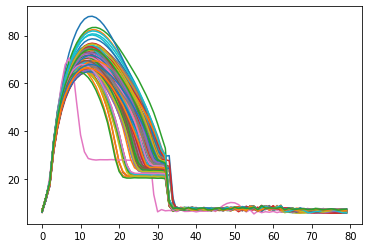

In [104]:
for surikire_breath_id in tqdm(surikire_breath_ids):
    df_ori = df_hoseis[df_hoseis['breath_id']==surikire_breath_id].reset_index(drop=True)
    plt.plot(df_ori['pressure'])

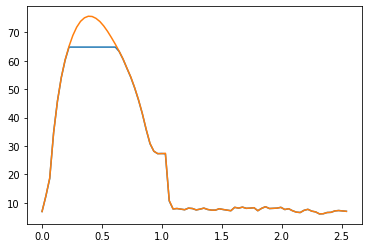

In [85]:
plt.plot(df_ori['time_step'], df_ori['pressure'])
plt.plot(df_ori['time_step'], df_ori['pressure_'])

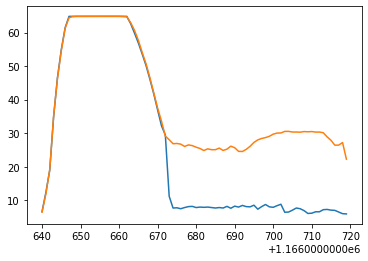

In [31]:
plt.plot(train[train['breath_id']==121488]['pressure'])
plt.plot(train[train['breath_id']==121488]['pressure_oof'])

In [ ]:
train['time_id'] = np.tile(np.arange(80), len(train['breath_id'].unique()))

In [115]:
train_pivot = train.pivot_table(index="breath_id", columns= "time_id", values="pressure")

breath_id
1         50
2         20
3         20
4         50
5         50
          ..
125740    50
125742    10
125743    10
125745    50
125749    10
Name: C, Length: 75450, dtype: int64

In [117]:
from sklearn.preprocessing import StandardScaler
import umap

In [118]:
ss = StandardScaler()
df_feats_ss = pd.DataFrame(ss.fit_transform(train_pivot), columns=train_pivot.columns)

# 次元圧縮実行
# 次元圧縮に使うアルゴリズムをインスタンス化
n_components = 2
model = umap.UMAP(n_components=n_components, random_state=0)

list_cols = [f'dim{i+1}' for i in range(n_components)]
df_feats_red = pd.DataFrame(model.fit_transform(df_feats_ss), columns=list_cols)

In [126]:
df_feats_red['breath_id'] = train['breath_id'].unique()
df_feats_red['C'] = train.groupby('breath_id')['C'].mean().values
df_feats_red['R'] = train.groupby('breath_id')['R'].mean().values
df_feats_red

,dim1,dim2,C,breath_id,R
0,15.439722,-0.777232,50,1,20
1,13.048867,17.696260,20,2,20
2,13.417745,-1.541488,20,3,50
3,11.513403,-1.327232,50,4,50
4,12.760830,12.862494,50,5,5
...,...,...,...,...,...
75445,12.899651,5.954224,50,125740,50
75446,10.169523,-6.515478,10,125742,20
75447,4.650566,-5.416359,10,125743,20
75448,15.210732,1.813036,50,125745,50


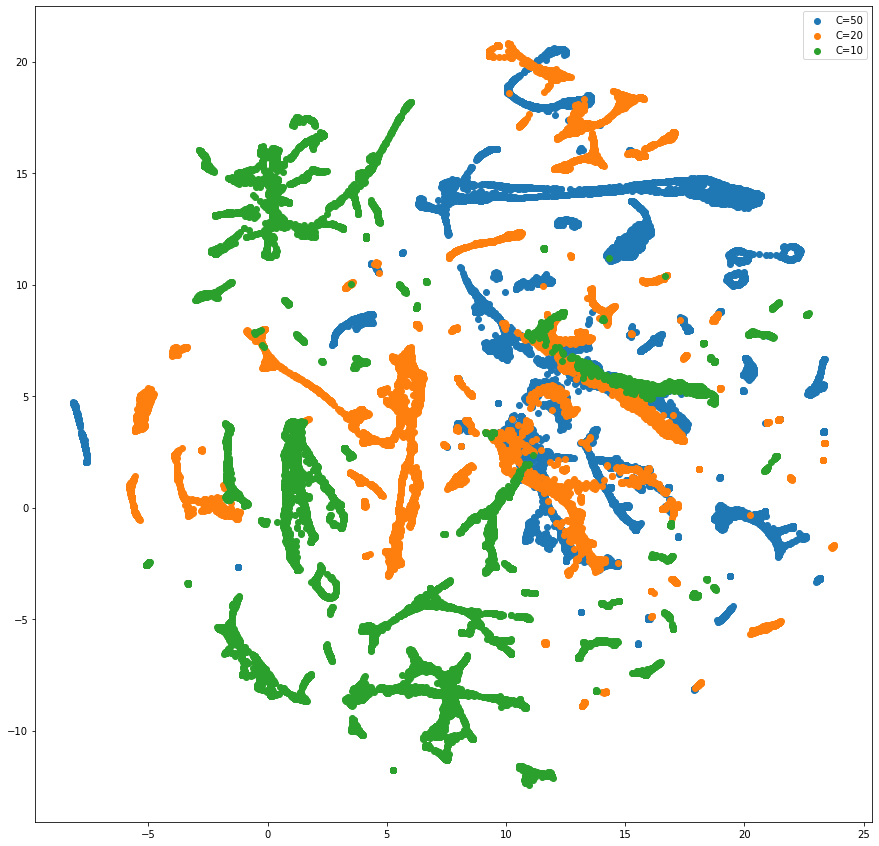

In [127]:
plt.figure(figsize=(15, 15))
plt.scatter(df_feats_red[df_feats_red['C']==50].iloc[:, 0], df_feats_red[df_feats_red['C']==50].iloc[:, 1], label='C=50')
plt.scatter(df_feats_red[df_feats_red['C']==20].iloc[:, 0], df_feats_red[df_feats_red['C']==20].iloc[:, 1], label='C=20')
plt.scatter(df_feats_red[df_feats_red['C']==10].iloc[:, 0], df_feats_red[df_feats_red['C']==10].iloc[:, 1], label='C=10')
plt.legend()